# Test Campaign Planning
Planning for a standard DVS test campaign. Direct queries to aph@sarao.ac.za.

                                                              "Template" last updated on 29/11/2025

In [16]:
%matplotlib inline
import pylab as plt
import numpy as np

In [2]:
import katpoint
from dvs import planning, cattools

/home/aph/work/dvs/libraries/analysis/katsemodels.py:1212: RuntimeWarning: divide by zero encountered in divide
  I_therm = lambda p, f_MHz: p[0] * (f_MHz/p[1])**2 * (1 - np.exp(-(f_MHz/p[1])**-2)) # The radiation intensity of a nebula in thermal equilibruim... Opacity tau(f)=(f/p[1])^2 fits the data.
/home/aph/work/dvs/libraries/analysis/katsemodels.py:1212: RuntimeWarning: invalid value encountered in multiply
  I_therm = lambda p, f_MHz: p[0] * (f_MHz/p[1])**2 * (1 - np.exp(-(f_MHz/p[1])**-2)) # The radiation intensity of a nebula in thermal equilibruim... Opacity tau(f)=(f/p[1])^2 fits the data.


In [3]:
## Some available catalogues:
!ls ../catalogues

arrays					    sources_all.csv
fluxmodels.csv				    targets_pnt_Ku.csv
i_aor_e_330.50_is-904_20250204_235305.txt   targets_pnt_L.csv
i_aor_e_359.00_is-1002_20250204_235305.txt  targets_pnt_S.csv
rfi_mask.txt				    targets_pnt_XXX.csv


In [4]:
def mkTobs(start):
    """ @param start: "YYYY-MM-DD" or "YYYY-MM-DD HH:mm:ss"
        @return: (Tstart, Tstop) in UTC seconds """
    day_startend = ["00:00:00", "23:59:59"] # UTC times to start & stop each day's assessment
    if (" " in start): # Day + time of day
        start, day_startend[0] = start.split(" ")
    # Alternative for specifying a time in UTC: np.datetime64(f"{day}T{_}").astype(float)
    return [katpoint.Timestamp(f"{start} {_}").secs for _ in day_startend]  # Start & stop, in UTC seconds


# The calendar day from midnight to midnight
Tobs = mkTobs("2024-07-25")

# OR from a particular day & time till end of that day
Tobs = mkTobs("2024-07-25 22:00:00")

# OR right now for next 1hour
#Tobs = katpoint.Timestamp().secs + np.arange(0,2)*3600

## What's up?

Targets visible from antenna 'A0' at 2025-12-03 23:47:34.754 SAST, with flux density (Jy) evaluated at 3000 MHz

Target                        Azimuth    Elevation <    Flux Fringe period
------                        -------    --------- -    ---- -------------
Zenith                      0:00:00.0   90:00:00.0 -        
J034840-274916            -49:39:41.0   85:29:48.6 \        
J034632-342252           -135:01:01.4   84:49:29.9 \        
PKS J0329-2357            -49:59:39.6   79:46:41.4 \        
PKS J0340-2119            -30:27:54.1   79:09:44.4 \        
J0447-2203                 50:47:10.0   76:57:00.0 /        
J043701-184453             33:43:55.4   75:51:17.6 /        
J0440-4333                153:23:51.4   75:22:02.7 /     5.6
PKS J0348-1610            -14:22:32.6   74:57:44.2 \        
J0522-3627                114:32:29.2   72:41:04.3 /    12.0
PKS J0405-1308              1:15:01.9   72:20:56.9 -        
PKS J0513-2159             64:49:54.7   72:07:45.8 /        
J0455

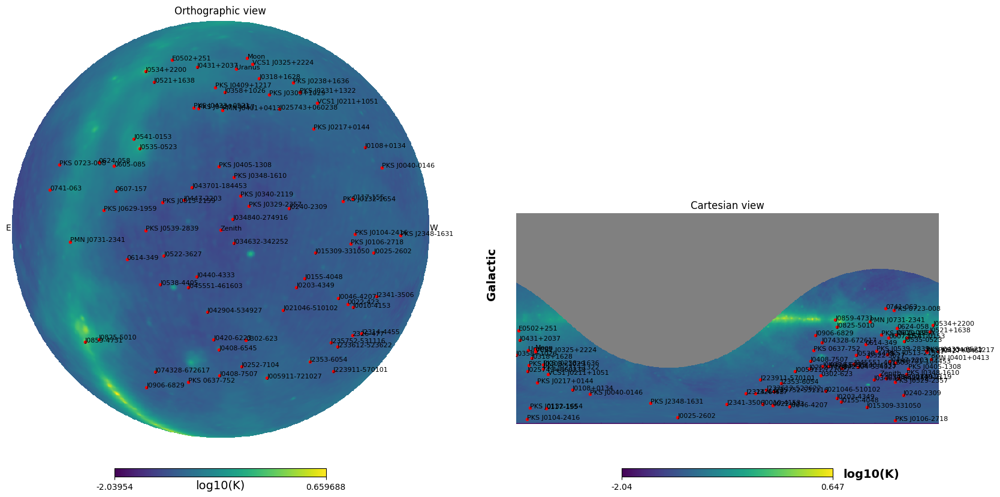

In [63]:
Tobs = [katpoint.Timestamp().secs]
planning.radiosky(Tobs[0], f_MHz=3000, catfn="../catalogues/targets_pnt_S.csv", el_limit_deg=15, tabulate=True)

## Pointing Measurements

Using  ../catalogues/targets_pnt_L.csv
  # PKS 1830-210, tags=radec, 18:33:39.92 -21:03:40.1, no flux info appears within 10 deg from [<katpoint.Target 'Moon' body=special at 0x7f649d77fac0>]
  # DVS B2-42 (1827-360, PKS 1827-360), tags=radec, 18:30:58.88 -36:02:30.1, no flux info appears within 10 deg from [<katpoint.Target 'Moon' body=special at 0x7f649d77fac0>]
  # Planning drops the following due to being within 1 deg away from other targets:
[<katpoint.Target 'PKS 1830-210' body=radec at 0x7f649d66cd60>
 <katpoint.Target 'DVS B2-42' body=radec at 0x7f649d66d4e0>]


/home/aph/venv-py3/lib/python3.10/site-packages/katpoint/pointing.py:340: FutureWarning: Pointing model parameters that are not being fitted will be kept in future and not zeroed - zero the model beforehand instead
  warnings.warn('Pointing model parameters that are not being fitted will be kept in '


  # PKS 1830-210, tags=radec, 18:33:39.92 -21:03:40.1, no flux info appears within 10 deg from [<katpoint.Target 'Moon' body=special at 0x7f649d6232b0>]
  # DVS B2-42 (1827-360, PKS 1827-360), tags=radec, 18:30:58.88 -36:02:30.1, no flux info appears within 10 deg from [<katpoint.Target 'Moon' body=special at 0x7f649d6232b0>]
  # Planning drops the following due to being within 1 deg away from other targets:
[<katpoint.Target 'PKS 1830-210' body=radec at 0x7f649d66cd60>
 <katpoint.Target 'DVS B2-42' body=radec at 0x7f649d66d4e0>]


/home/aph/venv-py3/lib/python3.10/site-packages/katpoint/pointing.py:340: FutureWarning: Pointing model parameters that are not being fitted will be kept in future and not zeroed - zero the model beforehand instead
  warnings.warn('Pointing model parameters that are not being fitted will be kept in '


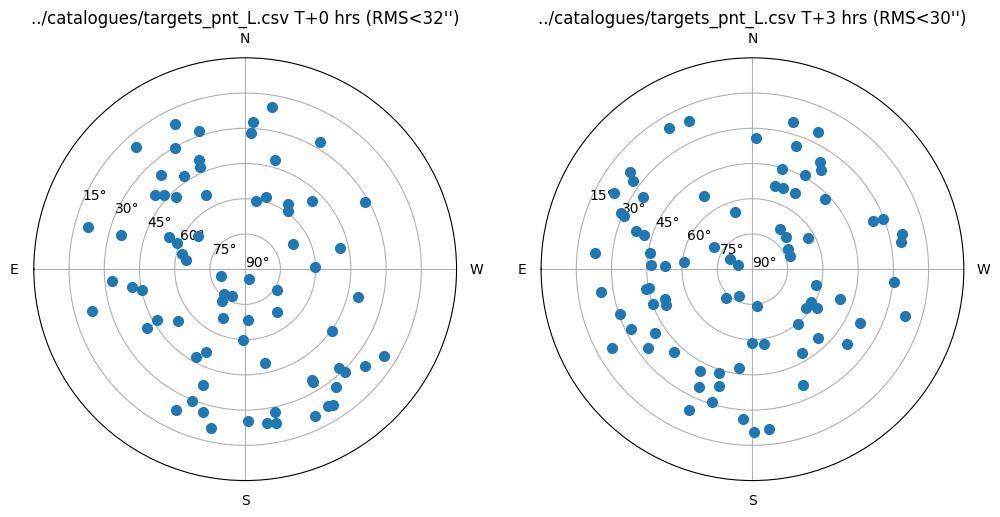

In [10]:
# See which of the two sessions will get better sky coverage using this catalogue:
Tobs = mkTobs("2025-07-10")
planning.sim_pointingmeasurements("../catalogues/targets_pnt_L.csv", Tstart=Tobs[0], Hr=3, S=2, el_limit_deg=15, sunmoon_separation_deg=10,
                                  rms_error_arcsec=5) # Centroid fitting accuracy ~ FWHM/SNR ~5arcsec at 3GHz & Tsys~20K

Using  ../catalogues/targets_pnt_Ku.csv
  # PKS 1830-210, tags=radec, 18:33:39.92 -21:03:40.1, no flux info appears within 10 deg from [<katpoint.Target 'Moon' body=special at 0x7f649d88b610>]
  # Planning drops the following due to being within 1 deg away from other targets:
[<katpoint.Target 'PKS 1830-210' body=radec at 0x7f649d766da0>]


/home/aph/venv-py3/lib/python3.10/site-packages/katpoint/pointing.py:340: FutureWarning: Pointing model parameters that are not being fitted will be kept in future and not zeroed - zero the model beforehand instead
  warnings.warn('Pointing model parameters that are not being fitted will be kept in '
/home/aph/venv-py3/lib/python3.10/site-packages/katpoint/pointing.py:340: FutureWarning: Pointing model parameters that are not being fitted will be kept in future and not zeroed - zero the model beforehand instead
  warnings.warn('Pointing model parameters that are not being fitted will be kept in '


  # PKS 1830-210, tags=radec, 18:33:39.92 -21:03:40.1, no flux info appears within 10 deg from [<katpoint.Target 'Moon' body=special at 0x7f649d8596f0>]
  # Planning drops the following due to being within 1 deg away from other targets:
[<katpoint.Target 'PKS 1830-210' body=radec at 0x7f649d766da0>]


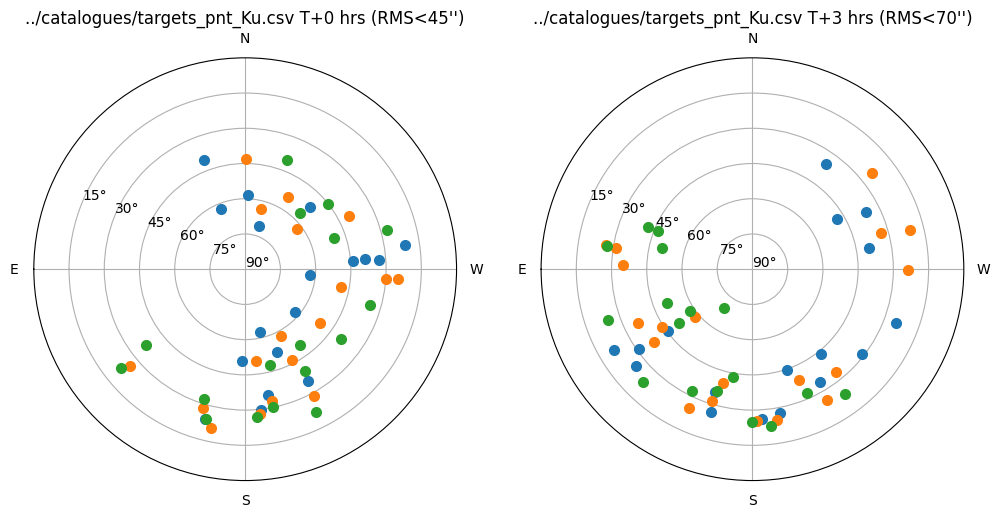

In [11]:
# This catalogue has fewer targets,so multiple visits (different colours) to the targets in each session
planning.sim_pointingmeasurements("../catalogues/targets_pnt_Ku.csv", Tstart=Tobs[0], Hr=3, S=2, el_limit_deg=15, sunmoon_separation_deg=10,
                                  rms_error_arcsec=8) # Centroid fitting accuracy ~ FWHM/SNR ~8arcsec at 13GHz & Tsys~150K

## Tip curve measurements

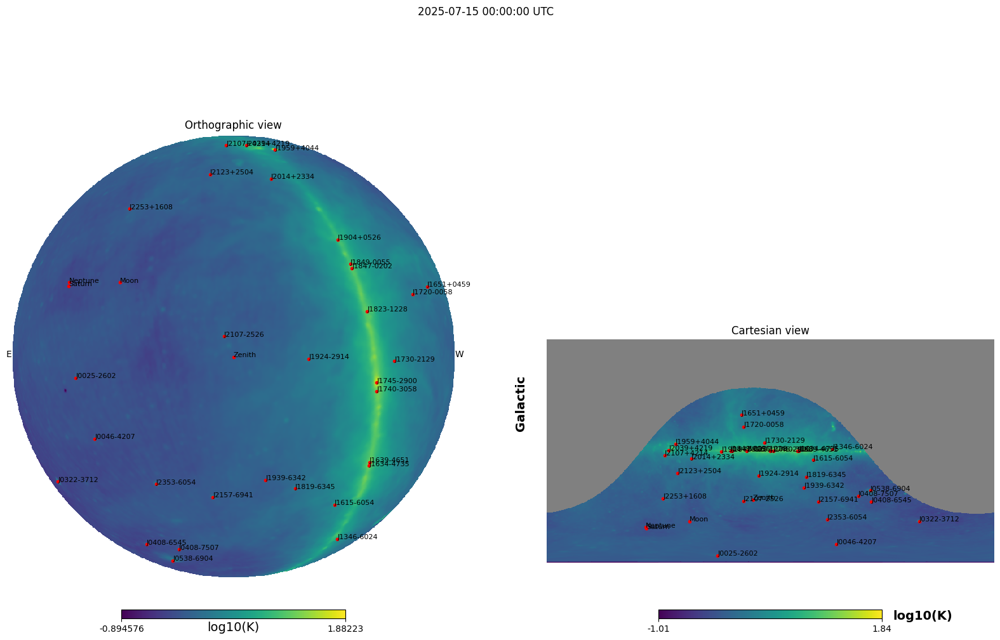

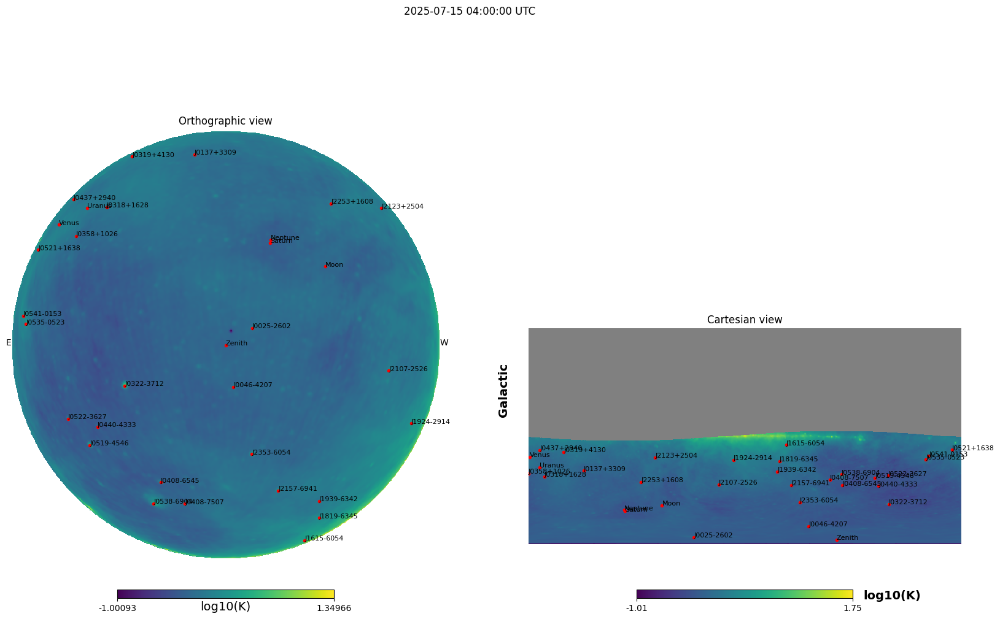

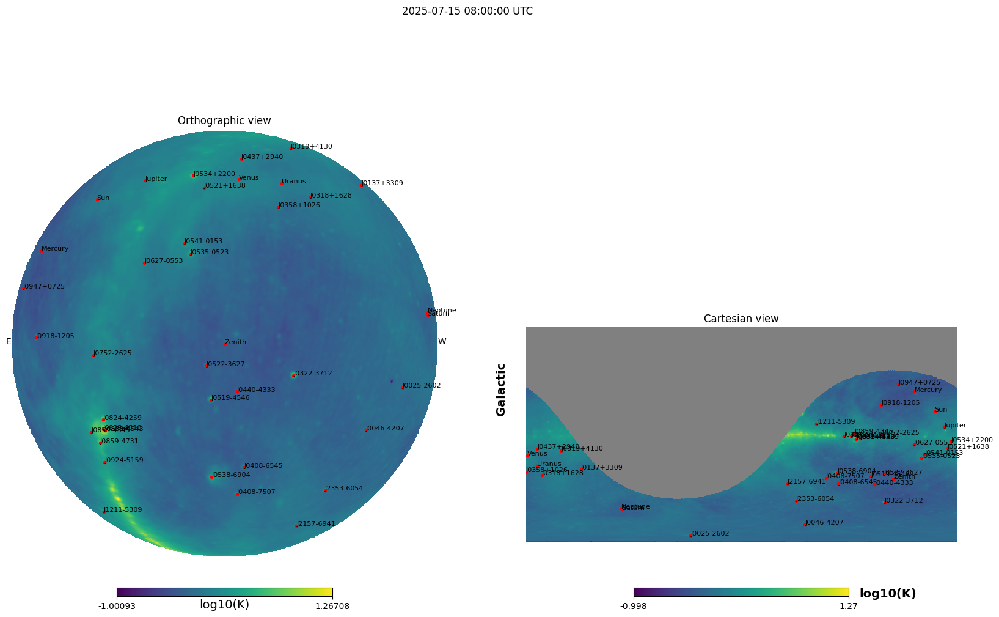

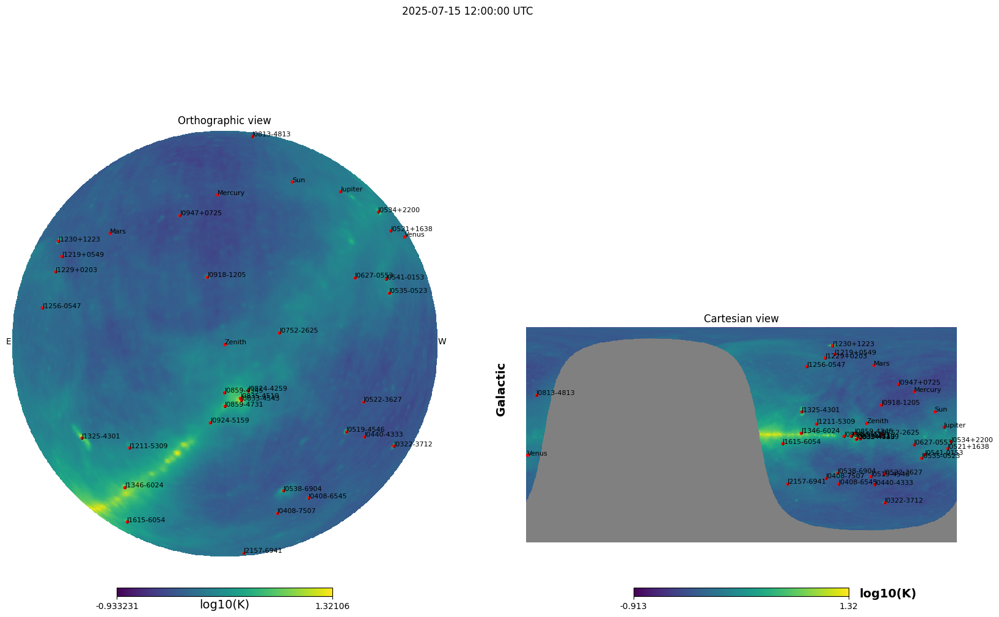

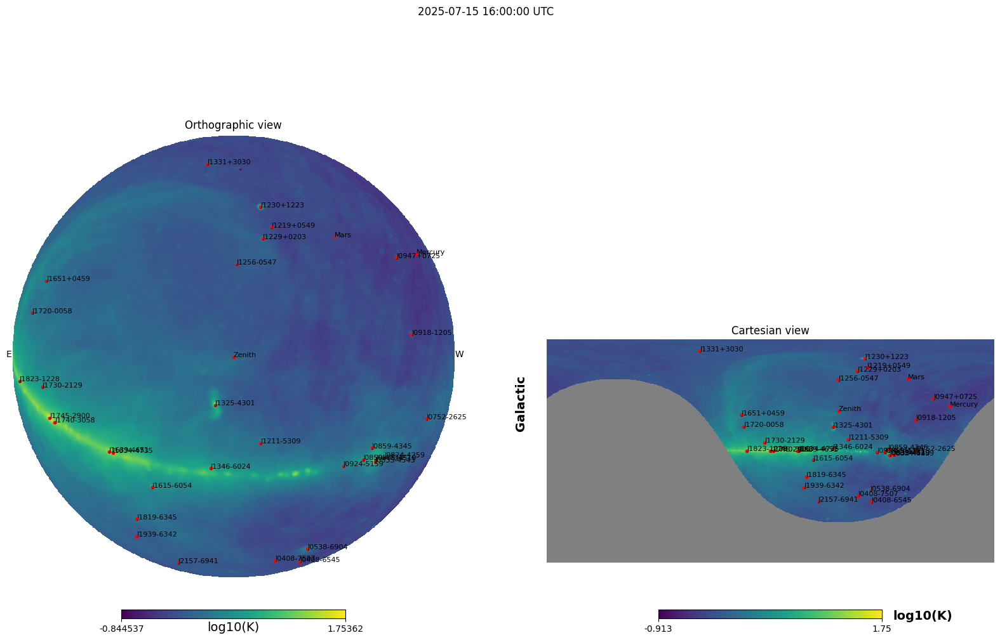

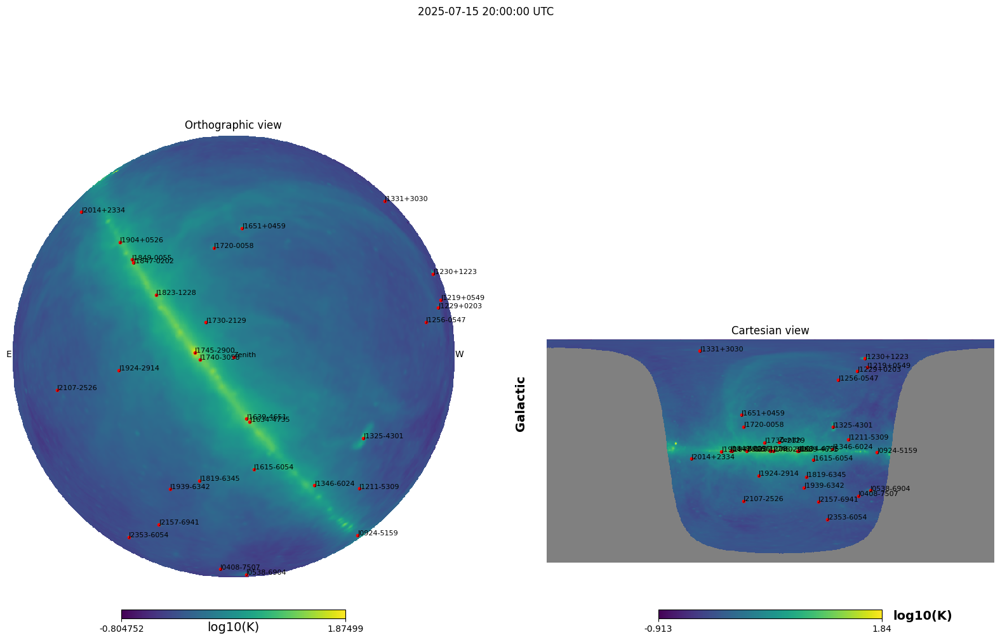

In [9]:
# The calendar day to run the assessment for
Tobs = mkTobs("2025-07-15")

# Want to pick a time of day and an azimuth angle that doesn't cross the galaxy or the Sun!
for T in np.arange(Tobs[0], Tobs[-1], 4*60*60): # Consider 4 hourly intervals
    planning.radiosky(T, f_MHz=1400, catfn="../catalogues/sources_all.csv", el_limit_deg=10, tabulate=False)
    plt.suptitle("%s UTC"% katpoint.Timestamp(T))

## Drift Scans / Holography

          Name |           Rise UTC |            Set UTC | Max Rate [deg/sec@1GHz] | Flux [Jy@1GHz]
--------------------------------------------------------------------------------
      1610-771 | 2025/12/3 04:08:37 | 2025/12/4 15:58:41 |                   -19.3 | nan
      1718-649 | 2025/12/3 05:34:35 | 2025/12/4 16:42:01 |                   -37.0 | nan
      1741-038 | 2025/12/3 07:41:31 | 2025/12/4 15:13:16 |                   -87.4 | nan
    J0440-4333 | 2025/12/3 17:19:17 | 2025/12/4 03:27:28 |                    63.5 | nan
    J0522-3627 | 2025/12/3 18:12:54 | 2025/12/4 03:59:08 |                    70.5 | nan
    J1130-1449 | 2025/12/3 01:02:24 | 2025/12/4 09:26:37 |                   -37.1 | 5.6
    J1229+0203 | 2025/12/3 02:43:52 | 2025/12/4 09:42:50 |                   -57.1 | nan
    J1256-0547 | 2025/12/3 02:49:06 | 2025/12/4 10:31:37 |                   -64.2 | nan
    J1331+3030 |                nan |                nan |                   -62.7 | nan
J142755-420612 | 2

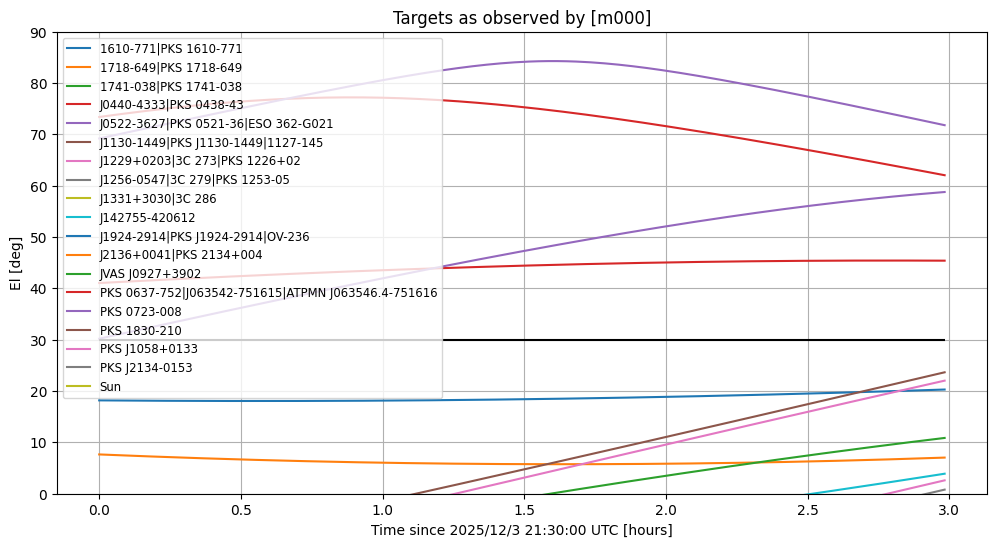

In [59]:
# Holography targets
# in order of brightness, per Mattieu de Villiers 2025
lbandtargets = "3C 273|PKS 0408-65|PKS 1934-63|Hyd A|3C 279|PKS 0023-26|J0825-5010|J1924-2914"
lbandtargets += "|J0137+3309" # Very good response in L-band, 07/2025
sbandtargets = "3C 454.3|J1924-2914|J2136+0041|J0137+3309|PKS 1934-63|3C 279|PKS 0723-008|PKS 0408-65|PKS 1421-490|PKS 0023-26"#|J0825-5010"
kubandtargets = "3C 279|3C 273|3C 454.3" # X3 holography dynamic range only max 7dB (phase OK to 1 st sidelobe...?)

# Pointing, best SNR > 300
lpnt = '0022-423|0302-623|0614-349|0624-058|1215-457|1306-095|1610-771|1718-649|1722-55|1819-096|1827-360|2155-152|2326-477|DVS B2-11|DVS B2-15|DVS B2-21|DVS B2-24|DVS B2-29|DVS B2-9|J000613-062338|J0010-4153|J0022+0014|J0025-2602|J0108+0134|J0155-4048|J0203-4349|J021046-510102|J0240-2309|J0252-7104|J0318+1628|J0408-6545|J0408-7507|J0420-6223|J0437+2940|J0440-4333|J0447-2203|J045551-461603|J0519-4546|J0538-4405|J0825-5010|J0906-6829|J0918-1205|J1230+1223|J1311-2216|J1323-4452|J1424-4913|J142755-420612|J1517-2422|J155656-791403|J1733-1304|J1744-5144|J1819-6345|J1924-2914|J1939-6342|J2131-1207|J2131-2036|J2206-1835|J2229-3823|J225025+141956|J2302-3718|J2314-4455|J233612-523622|J2341-3506|J235752-531116|PKS 0637-752|PKS 1613-586|PKS 1830-210|PKS J0405-1308|PKS J1337-1257'
# Pointing, best SNR > 300 in S3
spnt = '0022-423|0302-623|0605-085|0607-157|0614-349|0624-058|0741-063|1015-314|1215-457|1245-197|1306-095|1416+067|1512-0905|1610-771|1718-649|1722-55|1741-038|1819-096|1827-360|2128+048|2148+0657|2155-152|2326-477|J000613-062338|J0010-4153|J0022+0014|J0025-2602|J0108+0134|J0137+3309|J0155-4048|J021046-510102|J0240-2309|J0252-7104|J0318+1628|J034840-274916|J0408-6545|J0408-7507|J0420-6223|J0431+2037|J0437+2940|J0440-4333|J045551-461603|J0521+1638|J0522-3627|J0538-4405|J074328-672617|J0825-5010|J0854+2006|J0918-1205|J1008+0730|J1130-1449|J1229+0203|J1230+1223|J1256-0547|J1311-2216|J1323-4452|J1330+2509|J1331+3030|J1347+1217|J1424-4913|J142755-420612|J1517-2422|J1550+0527|J155656-791403|J1609+2641|J1733-1304|J1744-5144|J1819-6345|J1924-2914|J1939-6342|J2131-1207|J2136+0041|J2206-1835|J2225-0457|J225025+141956|J2253+1608|J2302-3718|J2314-4455|J233612-523622|J235752-531116|JVAS J0237+2848|PKS 0637-752|PKS 0723-008|PKS 1613-586|PKS 1830-210|PKS J0231+1322|PKS J0238+1636|PKS J0405-1308|PKS J0433+0521|PKS J0900-2808|PKS J1058+0133|PKS J1118+1234|PKS J1154-3505|PKS J1239-1023|PKS J1316-3338|PKS J1337-1257|PKS J1357-1744|PKS J1510-0543|PKS J1625-2527|PKS J1939-1525|PKS J2134-0153|PKS J2232+1143|PKS J2258-2758|PKS J2346+0930|PKS J2348-1631|Per A|QSO J0336+3218|VCS2 J2015+3710'
# Pointing, best SNR > 100 in X3 & excludes "pointing outliers"
kupnt = '1610-771|1718-649|1741-038|J0440-4333|J0522-3627|J1130-1449|J1229+0203|J1256-0547|J1331+3030|J142755-420612|J1924-2914|J2136+0041|JVAS J0927+3902|PKS 0637-752|PKS 0723-008|PKS 1830-210|PKS J1058+0133|PKS J2134-0153'
#kupnt += '0605-085|0607-157|J045551-461603|J0538-4405|J0854+2006|J1424-4913|J1733-1304|J2131-1207|J2253+1608|PKS J1337-1257|PKS J2232+1143' # Best SNR > 50 in X3

Tobs = katpoint.Timestamp("2025-12-03 21:30:00").secs + np.arange(4)*3600
planning.describe_target(kupnt+"|Sun",
                         catfn="../catalogues/targets_pnt_S.csv", horizon_deg=30,
                         date=Tobs[0], end_date=Tobs[-1], figsize=(12,6));

16h35 -- Pointing, 60min
17h36 -- CLIPPED-3C 454.3-CLIPPED, 90min
19h06 -- Pointing, 120min
21h07 -- CLIPPED-3C 48-CLIPPED, 90min
22h38 -- 3C 454.3, 90min
00h08 -- Pointing, 180min


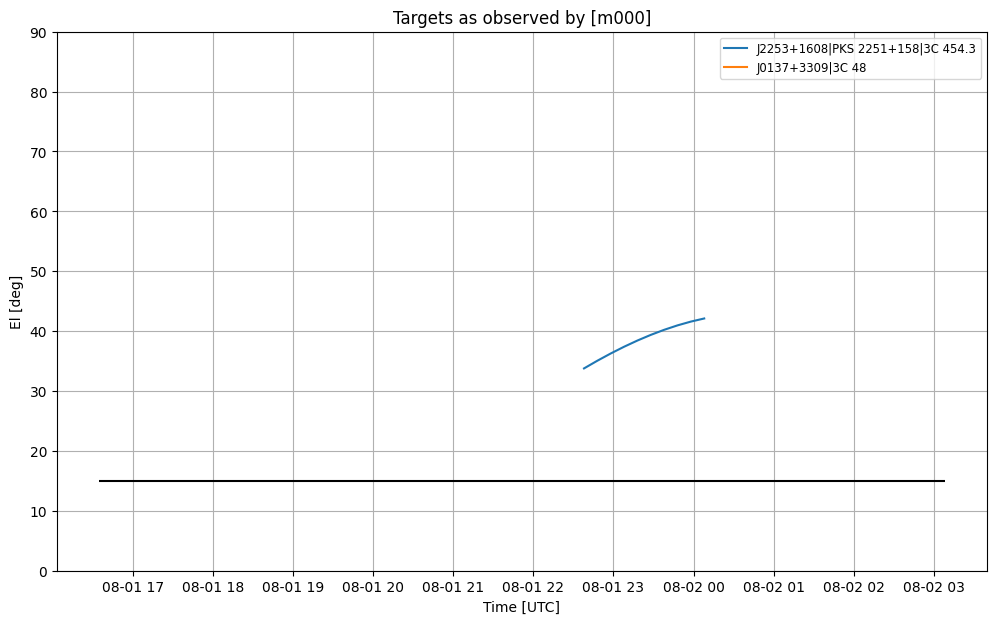

In [52]:
# Holography + pointing sequences
schedule = [("Pointing", 60*60),
            ("3C 454.3", 2*.75*60*60),
            ("Pointing", 2*60*60),
            ("3C 48", 2*.75*60*60),
            ("3C 454.3", 2*.75*60*60),
            ("Pointing", 3*60*60),
]

Tobs = katpoint.Timestamp("2025-08-01 16:35:00").secs # UTC
planning.sim_observations(schedule, catfn="../catalogues/targets_pnt_S.csv", Tstart=Tobs, el_limit_deg=15,
                 figsize=(12,7))

          Name |           Rise UTC |            Set UTC | Max Rate [deg/sec@3GHz] | Flux [Jy@3GHz]
--------------------------------------------------------------------------------
           Sun | 2025/7/15 07:11:53 | 2025/7/15 14:08:49 |                   157.1 | nan
    J0534+2200 | 2025/7/15 05:12:40 | 2025/7/16 11:56:19 |                  -189.2 | nan
    J0535-0523 | 2025/7/15 03:48:47 | 2025/7/16 13:21:08 |                  -202.8 | nan
    J0918-1205 | 2025/7/15 07:15:18 | 2025/7/15 17:22:53 |                   231.9 | 21.5
    J1651+0459 | 2025/7/15 15:29:04 | 2025/7/16 00:12:53 |                   231.0 | 20.2
    J0519-4546 | 2025/7/15 02:00:17 | 2025/7/15 14:41:41 |                  -150.4 | 24.9
    J1230+1223 | 2025/7/15 11:31:12 | 2025/7/15 19:31:34 |                   257.1 | 111.9
    J1939-6342 | 2025/7/15 15:09:26 | 2025/7/16 06:10:25 |                   -75.4 | 10.6
    J0408-6545 | 2025/7/14 23:25:34 | 2025/7/15 14:52:44 |                  -103.6 | 6.1
    J1331+30

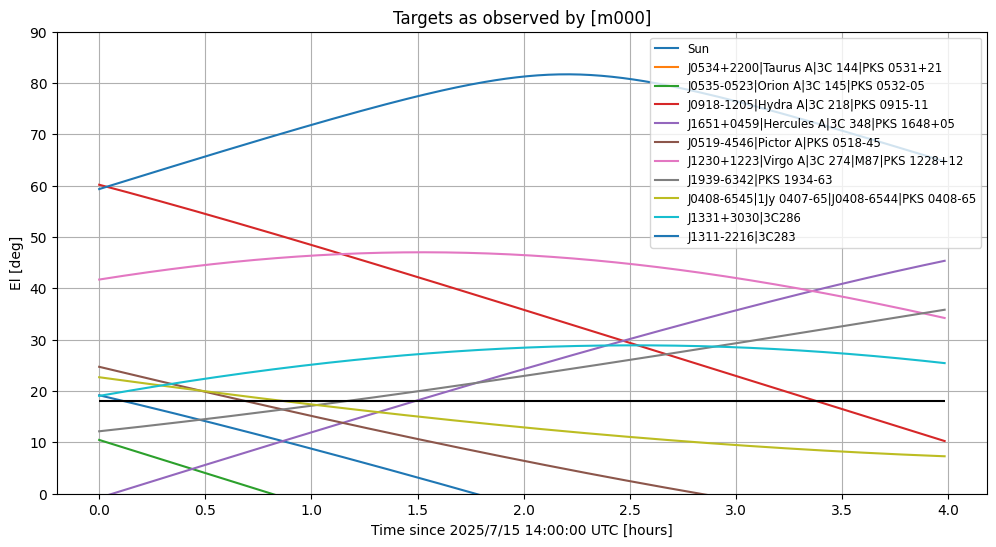

In [13]:
# Drift scan targets
Tobs = katpoint.Timestamp("2025-07-15 14:00:00").secs + np.arange(5)*3600

planning.describe_target("Sun|Taurus A|Orion A|Hydra A|Hercules A|Pictor A|Virgo A|PKS 1934-63|J0408-6545|3C286|3C283",
                         catfn="../catalogues/fluxmodels.csv", horizon_deg=18, 
                         date=Tobs[0], end_date=Tobs[-1], freq=3e9, figsize=(12,6));

          Name |           Rise UTC |            Set UTC | Max Rate [deg/sec@1GHz] | Flux [Jy@1GHz]
--------------------------------------------------------------------------------
    J1330+2509 | 2025/11/6 05:33:29 | 2025/11/6 12:31:56 |                    79.5 | 8.5
    J1347+1217 | 2025/11/6 05:03:44 | 2025/11/6 13:35:33 |                    85.8 | 5.6
    J0535-0523 | 2025/11/6 20:02:44 | 2025/11/6 06:10:51 |                    87.3 | nan
    J1609+2641 | 2025/11/6 08:18:49 | 2025/11/6 15:02:37 |                    78.6 | 4.7
    J0918-1205 | 2025/11/6 23:29:13 | 2025/11/6 10:08:40 |                    85.7 | 58.5
           Sun | 2025/11/6 04:49:20 | 2025/11/6 15:46:42 |                   -84.0 | nan


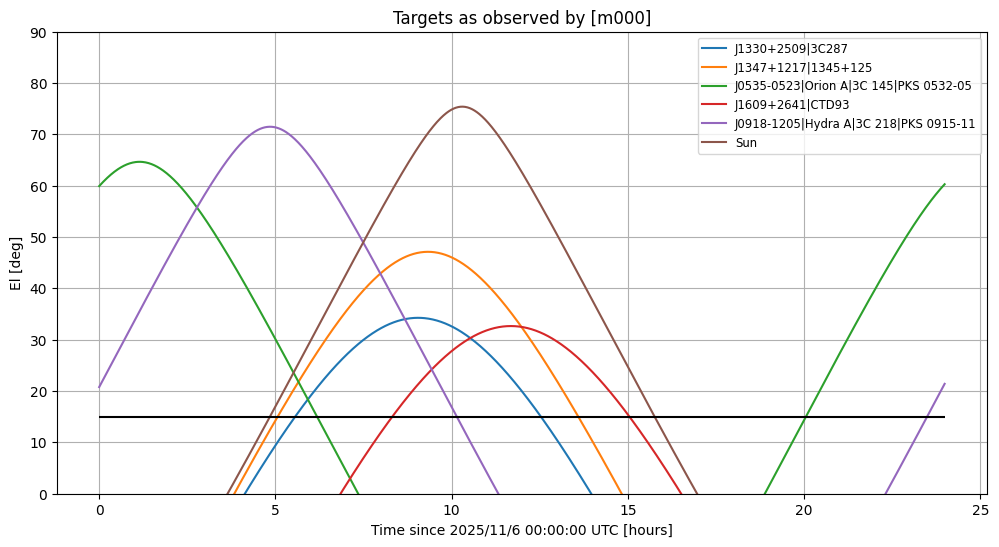

In [29]:
planning.describe_target("3C287|J1347+1217|Orion A|J1609+2641|Hydra A|Sun",
                         catfn="../catalogues/fluxmodels.csv", horizon_deg=15,
                         date=katpoint.Timestamp("2025-11-6 00:00:00").secs, end_date=katpoint.Timestamp("2025-11-6 00:00:00").secs+24*60*60, figsize=(12,6));

10h31 -- J1609+2641, 12min
10h44 -- J1609+2641, 12min
10h57 -- J1609+2641, 12min
11h10 -- J1609+2641, 12min
11h23 -- J1609+2641, 12min
11h36 -- J1609+2641, 12min
11h49 -- J1609+2641, 12min
12h02 -- J1609+2641, 12min
12h15 -- J1609+2641, 12min
12h28 -- J1609+2641, 12min


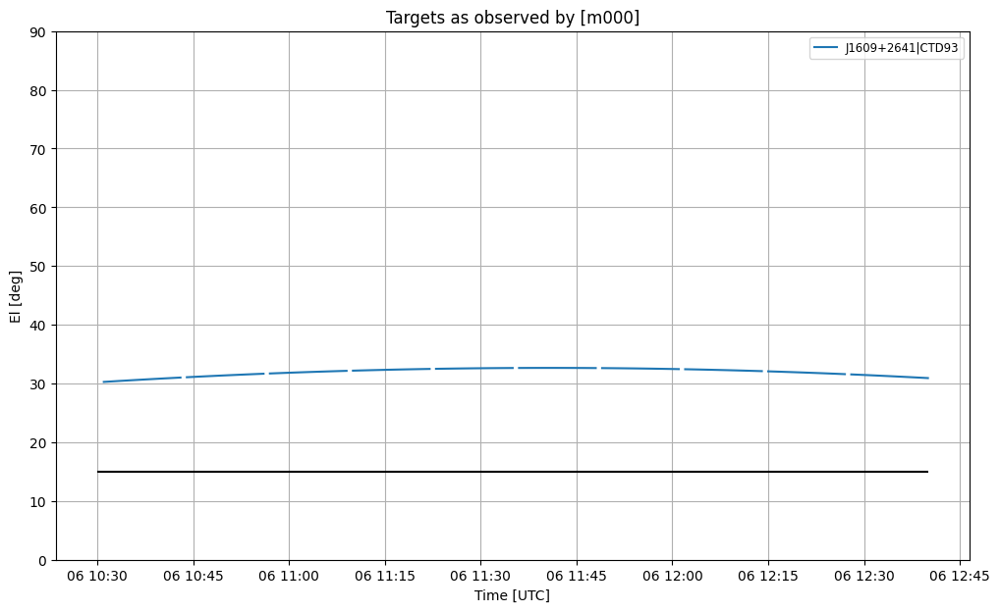

In [39]:
# Drift scan sequence, with durations for S4
schedule = [("3C287", 12*60)]*10; Tobs = katpoint.Timestamp("2025-11-6 08:00:00").secs # UTC
# schedule = [("Orion A", 12*60)]*10; Tobs = katpoint.Timestamp("2025-11-6 24:00:00").secs # UTC
schedule = [("J1609+2641", 12*60)]*10; Tobs = katpoint.Timestamp("2025-11-6 10:30:00").secs # UTC
# schedule = [("Hydra A", 12*60)]*10; Tobs = katpoint.Timestamp("2025-11-6 04:00:00").secs # UTC

planning.sim_observations(schedule, catfn="../catalogues/fluxmodels.csv", Tstart=Tobs, el_limit_deg=15,
                 figsize=(12,7))

In [ ]:
# Drift scan sequence, with durations for Band2
schedule = [("Hercules A", 30*60), ("PKS 1934-63", 60*60), ("Hercules A", 30*60), ("PKS 1934-63", 60*60), ("Hercules A", 30*60), ("PKS 1934-63", 60*60),
            ("Hercules A", 30*60), ("J0408-6545", 70*60), ("PKS 1934-63", 60*60),  ("J0408-6545", 70*60),  ("Pictor A", 45*60),
            ("Orion A", 35*60), ("Pictor A", 45*60), ("PKS 1934-63", 60*60), ("Orion A", 35*60), ("Pictor A", 45*60), ("Pictor A", 45*60),
            ("Orion A", 35*60), ("Pictor A", 45*60),
            ("Hydra A", 30*60), ("Hydra A", 30*60), ("3C283", 30*60), ("Virgo A", 30*60), ("Hydra A", 30*60),
            ("Hydra A", 30*60), ("3C283", 30*60), ("3C283", 30*60), ("Virgo A", 30*60), ("3C283", 30*60), ("Virgo A", 30*60), ("3C283", 30*60),
            ("3C286", 30*60), ("Virgo A", 30*60), ("3C286", 30*60), ("Virgo A", 30*60), ("3C283", 30*60)
]

Tobs = katpoint.Timestamp("2025-07-19 18:30:00").secs # UTC
planning.sim_observations(schedule, catfn="../catalogues/fluxmodels.csv", Tstart=Tobs, el_limit_deg=15,
                 figsize=(12,7))

          Name |           Rise UTC |            Set UTC | Max Rate [deg/sec@3GHz] | Flux [Jy@3GHz]
--------------------------------------------------------------------------------
           Sun | 2025/7/15 06:54:09 | 2025/7/15 14:26:33 |                   244.4 | nan
          Moon | 2025/7/15 21:54:06 | 2025/7/15 07:14:53 |                   256.6 | nan
       Mercury | 2025/7/15 07:57:00 | 2025/7/15 16:18:45 |                   255.6 | nan
         Venus | 2025/7/15 03:52:55 | 2025/7/15 11:33:40 |                   247.3 | nan
          Mars | 2025/7/15 09:37:02 | 2025/7/15 18:44:15 |                   261.3 | nan
       Jupiter | 2025/7/15 05:57:43 | 2025/7/15 13:13:00 |                  -241.6 | nan
        Saturn | 2025/7/15 22:15:39 | 2025/7/15 08:04:29 |                   263.1 | nan
        Uranus | 2025/7/15 03:04:01 | 2025/7/15 10:43:05 |                   247.4 | nan
       Neptune | 2025/7/15 22:17:18 | 2025/7/15 08:01:21 |                   263.2 | nan
        Zenith |  

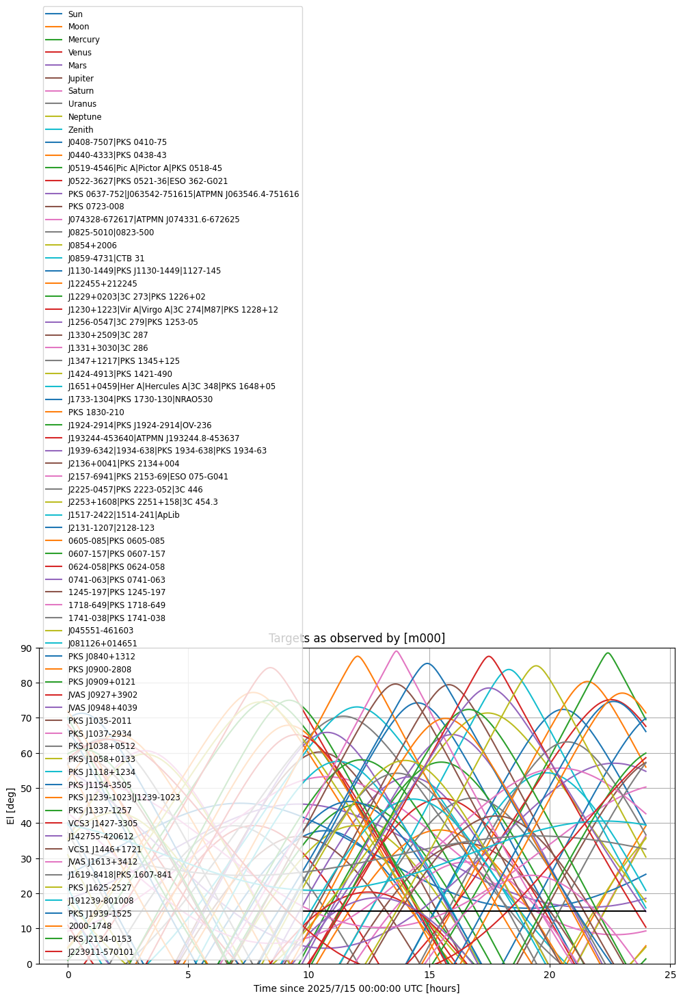

In [15]:
# When during the day will there be more targets at high elevation?
Tobs = mkTobs("2025-07-15")

planning.describe_target("*",
                         catfn="../catalogues/targets_pnt_Ku.csv", horizon_deg=15, catant="m000, -30.713, 21.444, 1050.0",
                         date=Tobs[0], end_date=Tobs[-1], freq=3e9, figsize=(12,6));

## Evaluate a Holography Measurement for Elevation Limits
**CAUTION!** simulate_holog only evaluates the first cycle

In [5]:
def simulate_holog(script_args, target_def=None, start_time=None):
    """ Simulates a planned holography run. If the target defintion and start time is given, it will assess
        whether it is expected to be successful or not -- use this for low and high elevation angles!
        
        Use like:
            simulate_holog("--scan-extent 9 --cycle-duration 5400 --scanspeed 0.05  --slewspeed -2 --tracktime 10 --num-cycles 2 --cycle-rotation 2 --twistfactor 1 --high-elevation-slowdown-factor 1",
                   "PKS J1924-2914, radec, 19:24:0, -29:14:0", katpoint.Timestamp("2025-02-16 02:30:0").secs)
               
        @return: success, is_rising, duration_secs, mean_elev, closest_sun_distance """
    %run ~/work/katsdpscripts/observation/holography_scan.py {script_args}
    
    if (target_def is None) or (start_time is None):
        boresight_return_period = opts.scan_extent / opts.scanspeed * 2.2 # Ballbark for twistfactor = 1
        print("Boresight visits @ %.f sec" % (boresight_return_period))
        return
    
    currentaz, currentel = 0, 0 # Makes minor difference to estimated actual start time
    target_sun = katpoint.Target("Sun, special")
    arraycenter_antenna = katpoint.Antenna("M0, -30.713, 21.444, 1050.0, 13.5")

    # The following is copied with three HACKs from holography_scan.py
    def test_target_azel_limits(target,clip_safety_margin,min_elevation,max_elevation):
        if opts.kind=='horizon_scan':#override, tight margins needed
            clip_safety_margin=0.5
        now=start_time #time.time() ## HACK 1
        targetazel=gen_track([now],target)[0][1:]
        print("Target az,el at start time", targetazel) # HACK 2
        slewtotargettime=np.max([0.5*np.abs(currentaz-targetazel[0]),1.*np.abs(currentel-targetazel[1])])+1.0#antenna can slew at 2 degrees per sec in azimuth and 1 degree per sec in elev
        starttime=now+slewtotargettime+opts.cycle_tracktime
        targetel=np.array(target.azel([starttime,starttime+1.])[1])*180.0/np.pi
        rising=targetel[1]>targetel[0]
        if rising:#target is rising - scan top half of pattern first
            cx=compositex
            cy=compositey
        else:  #target is setting - scan bottom half of pattern first
            cx=[com[::-1] for com in compositex[::-1]]
            cy=[com[::-1] for com in compositey[::-1]]
        meanelev=np.zeros(len(cx))
        minsunangle=np.zeros(len(cx))
        for iarm in range(len(cx)):#spiral arm index
            scan_data,clipping_occurred = gen_scan(starttime,target,cx[iarm],cy[iarm],timeperstep=opts.sampletime,high_elevation_slowdown_factor=opts.high_elevation_slowdown_factor,clip_safety_margin=clip_safety_margin,min_elevation=min_elevation,max_elevation=max_elevation)
            meanelev[iarm]=np.mean(scan_data[:,2])
            #if sun elevation below 0, horizon, then rather regard sunangle as 180 degrees; note katpoint functions returns radians
            minsunangle[iarm]=np.min([target.separation(target_sun,katpoint.Timestamp(timestamp),antenna=arraycenter_antenna) if target_sun.azel(timestamp=katpoint.Timestamp(timestamp),antenna=arraycenter_antenna)[1]>0 else np.pi for timestamp in scan_data[:,0]])*180/np.pi
            starttime=scan_data[-1,0]
            boresight_return_period = (starttime-now) / len(cx) # HACK 3 - added this
            if clipping_occurred:
                return False, rising, starttime-now, meanelev[iarm], minsunangle[iarm], boresight_return_period # HACK 3
        return True, rising, starttime-now, np.mean(meanelev), np.mean(minsunangle), boresight_return_period # HACK 3

    notclipped, rising, duration, mean_elev, mean_sun_dist, boresight_return_period = \
        test_target_azel_limits(katpoint.Target(target_def, antenna=arraycenter_antenna), clip_safety_margin=2, min_elevation=14, max_elevation=90)
    print("%s, %s, duration %.1f hrs, boresight visits @ %.f sec" % ({False:"CLIPPED",True:"Not clipped"}[notclipped], {True:"rising",False:"setting"}[rising], duration/3600, boresight_return_period))
    # As used in holography_scan.py
    return notclipped, rising, duration, mean_elev, mean_sun_dist

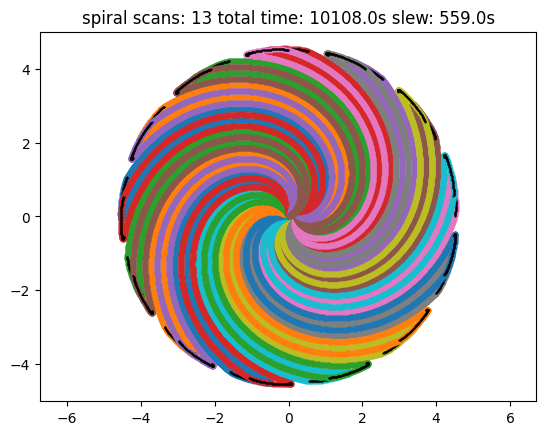

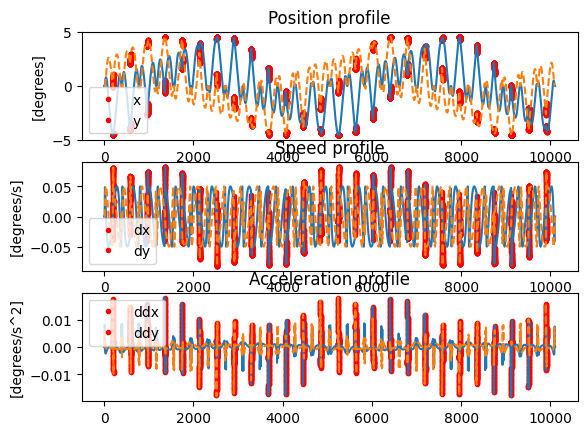

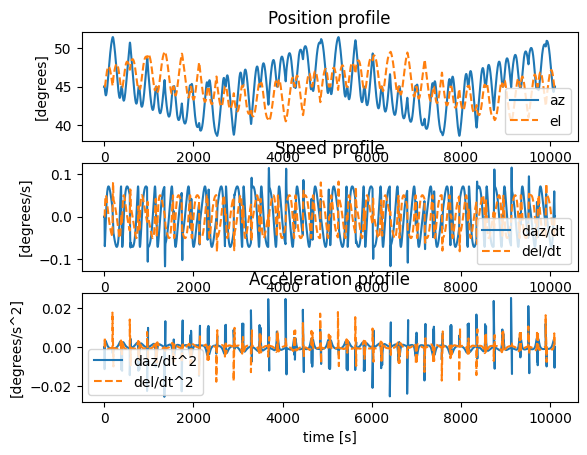

Target az,el at start time [-108.66616866   28.88469583]
Not clipped, setting, duration 1.1 hrs, boresight visits @ 306 sec


<Figure size 640x480 with 0 Axes>

In [32]:
simulate_holog("--scan-extent 9 --cycle-duration 5400 --scanspeed 0.05  --slewspeed -2 --tracktime 10 --num-cycles 2 --cycle-rotation 2 --twistfactor 1 --high-elevation-slowdown-factor 1",
               "PKS J1924-2914, radec, 19:24:0, -29:14:0", katpoint.Timestamp("2024-07-26 02:30:0").secs);

## Holography Scan Patterns

Note for the examples below: sample_time is used to "simulate" dump_time for this "debug plot" mode.

1. Keep scanspeed <= 0.2deg/sec to ensure the drive system remains accurate.
2. scanspeed*dump_time represents the measurement's smearing of the far field pattern. Keep this below HPBW/3 or you'll lose resolution!
   * One symptom if this is too fast, is that the boresight amplitudes may show cycles, since the boresight measurement is actually averaged over
   more than just the central part of the main lobe, and if the timing is off (due to pointing offset) or if the main lobe has rotational asymmetry
   then "cyclical dips" will be seen - which is interpreted as low SNR.
3. Keep the bore sight visiting interval shorter than the time over which the visibility phase changes by 180deg (3.1rad), to avoid ambiguous phase wraps.
   For twistfactor=1 a reasonable approximation is T_bore_sight ~= 2.4*extent / scan_speed, so use this to determine the range of extents that can be practically measured. 
4. Choose cycle-duration for uniform sampling i.e. to match density in "radial & tangential" directions, when sample_time=planned dump_time
5. For satellite beacons, use 4k modes for best SNR; for continuum targets use 1k modes to reduce the data volume.

For non-geostationary targets:
1. Use --num-cycles 1 if the target is setting (the observe script currently handles --cycle-rotation correctly only for rising and transiting targets)
2. Add  --high-elevation-slowdown-factor 2 


Band2: HPBW>0.8deg; T_bore_sight~500..800sec
* scanspeed*dump_time <= 0.2 [deg]
* max extent <= 214*scan_speed [deg] (i.e. up to 42deg)

S-band: HPBW>0.4deg; T_bore_sight~500..800sec
* scanspeed*dump_time <= 0.13 [deg]
* max extent <= (208..333)*scan_speed [deg] (i.e. 27..42 deg)

Ku-band: HPBW>0.11deg; T_bore_sight~200..500sec
* scanspeed*dump_time <= 0.035 [deg]
* max extent <= 208*scan_speed [deg] (i.e. 2.9..7.3 deg)


In [17]:
## Band2
HPBW_b2 = 1.2*(.3/.9)/15 * 180/np.pi # deg
HPBW_b2, 10*HPBW_b2

(1.5278874536821951, 15.278874536821952)

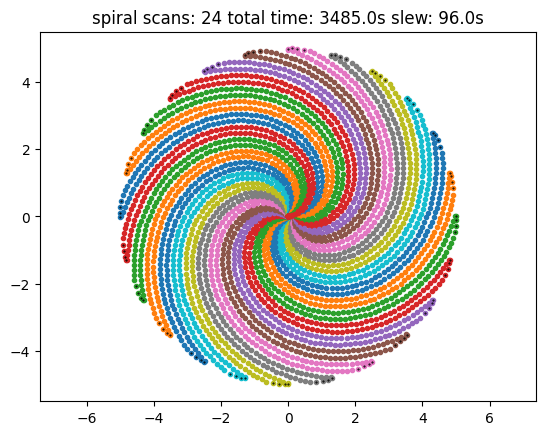

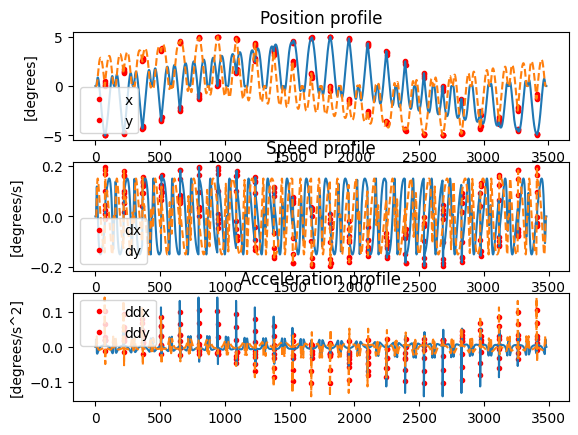

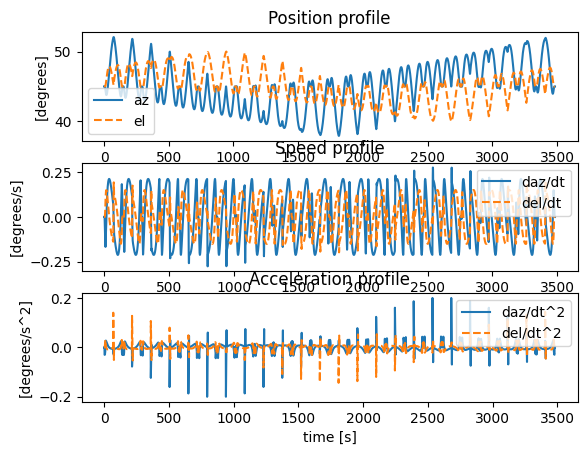

Boresight visits @ 147 sec


<Figure size 640x480 with 0 Axes>

In [18]:
# Low res, 1*1hr
# This pattern with num-cycles=1 works well for both rising and setting targets
simulate_holog("--sampletime 1 --scan-extent 10.0 --cycle-duration 3600 --scanspeed 0.15 --slewspeed -2 --num-cycles 1 --tracktime 5 --twistfactor 1 --high-elevation-slowdown-factor 2")

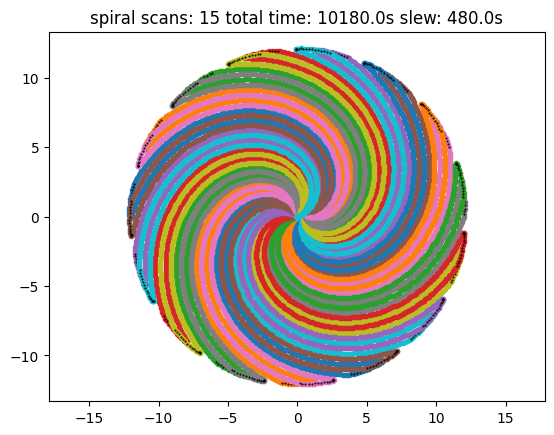

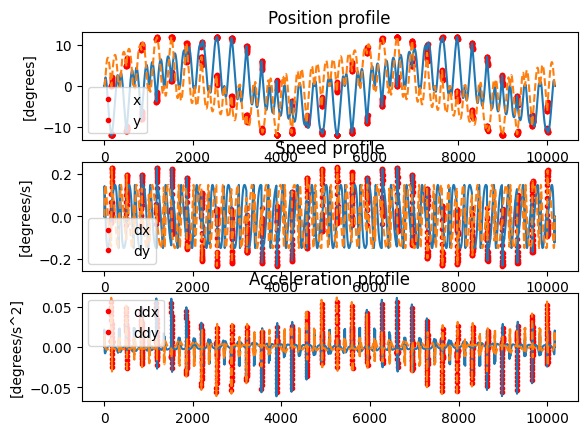

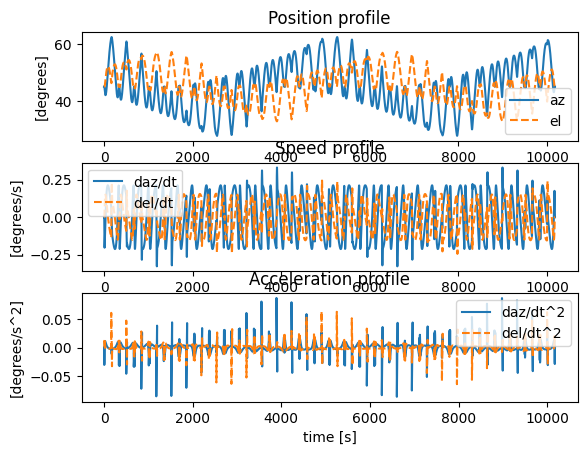

Boresight visits @ 352 sec


<Figure size 640x480 with 0 Axes>

In [19]:
# Moderate res, 2*1hr - improved sampling of main lobe & sidelobes
simulate_holog("--sampletime 1 --scan-extent 24.0 --cycle-duration 5400 --scanspeed 0.15 --slewspeed -2 --num-cycles 2 --cycle-rotations 2 --tracktime 5 --twistfactor 1 --high-elevation-slowdown-factor 2")

In [20]:
## S0band
HPBW_s = 1.2*(.3/1.75)/15 * 180/np.pi # deg
HPBW_s, 10*HPBW_s

(0.7857706904651289, 7.857706904651289)

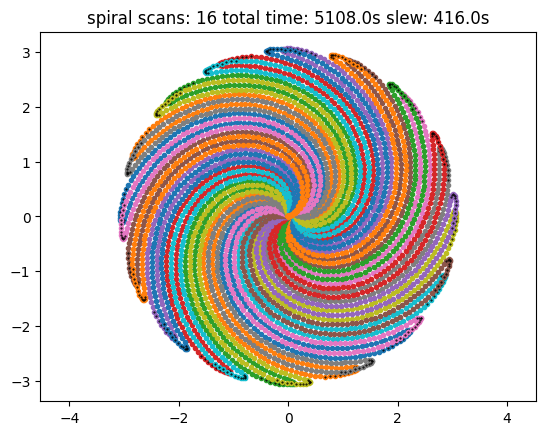

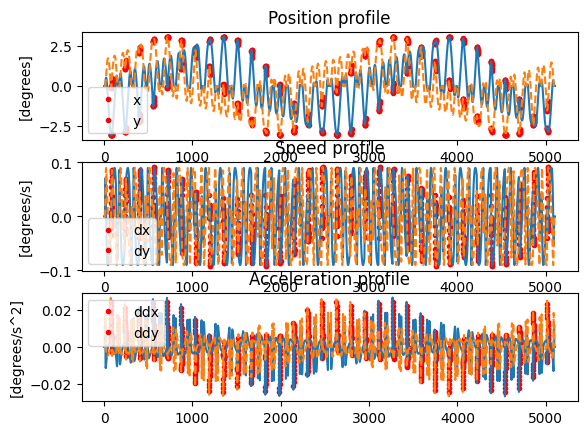

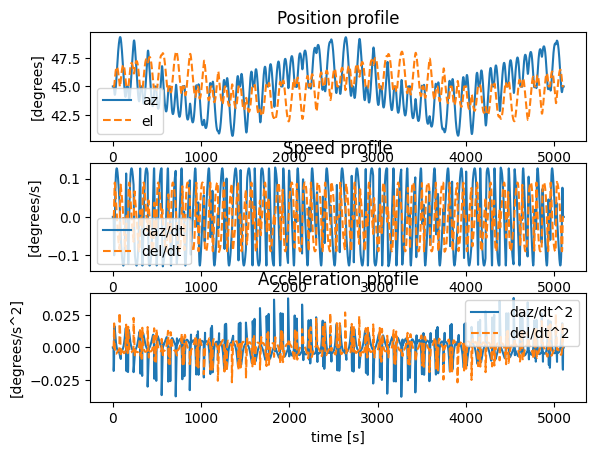

Boresight visits @ 147 sec


<Figure size 640x480 with 0 Axes>

In [21]:
# Low res, on continuum sources
# 2*1h ? [This worked OK, but try to reduce the time a bit more]
# simulate_holog("--sampletime 1 --scan-extent 6.0 --cycle-duration 3600 --scanspeed 0.07 --num-cycles 2 --cycle-rotations 2 --twistfactor 1 --high-elevation-slowdown-factor 2")
# 2*.75h?
simulate_holog("--sampletime 1 --scan-extent 6.0 --cycle-duration 2700 --scanspeed 0.09 --num-cycles 2 --cycle-rotations 2 --twistfactor 1 --high-elevation-slowdown-factor 2")

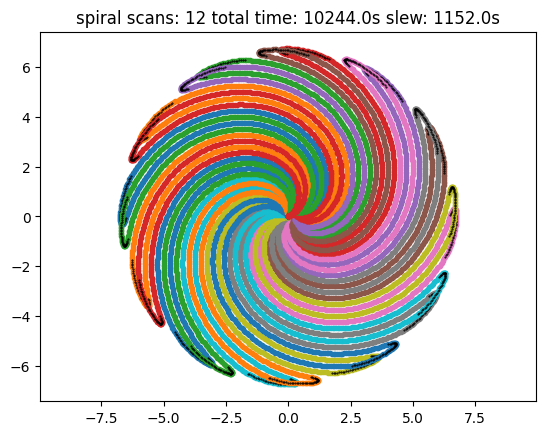

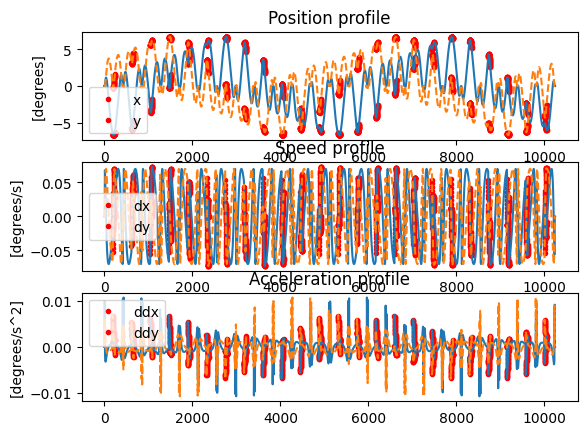

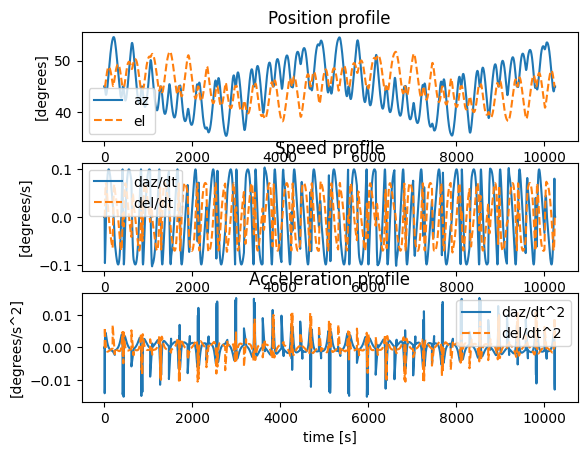

Boresight visits @ 409 sec


<Figure size 640x480 with 0 Axes>

In [22]:
# Moderate res, 2*1.5h on continuum sources
simulate_holog("--sampletime 1 --scan-extent 13.0 --cycle-duration 5400 --scanspeed 0.07 --num-cycles 2 --cycle-rotations 2 --twistfactor 1 --high-elevation-slowdown-factor 2")

In [23]:
## S4band
HPBW_s = 1.2*(.3/2.65)/15 * 180/np.pi # deg
HPBW_s, 10*HPBW_s

(0.5189051729486701, 5.189051729486701)

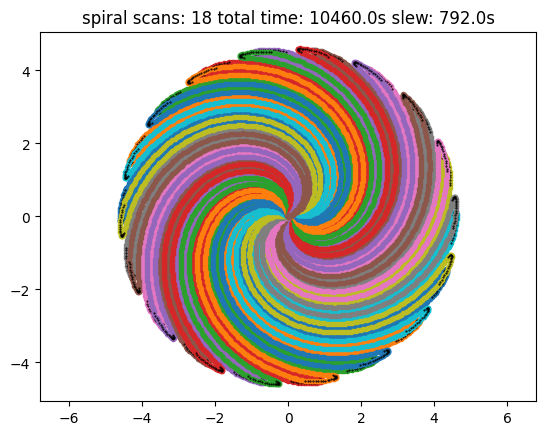

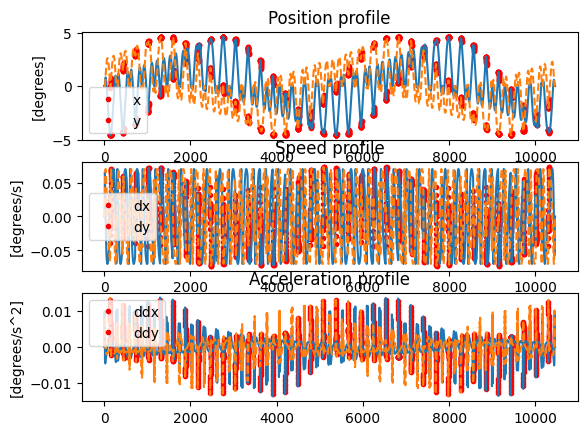

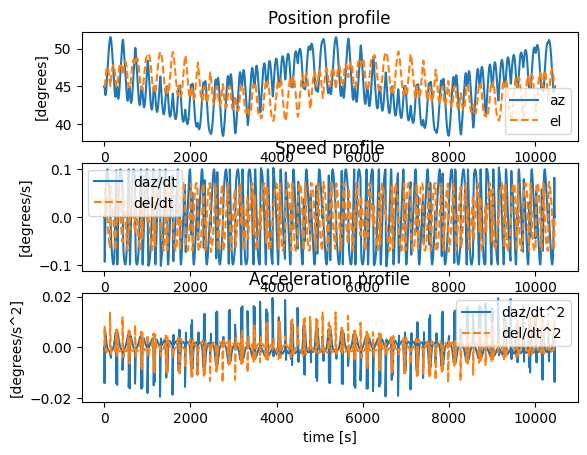

Boresight visits @ 283 sec


<Figure size 640x480 with 0 Axes>

In [24]:
# Moderate res, 2*1.5h on continuum sources
simulate_holog("--sampletime 1 --scan-extent 9.0 --cycle-duration 5400 --scanspeed 0.07 --num-cycles 2 --cycle-rotations 2 --twistfactor 1 --high-elevation-slowdown-factor 2")

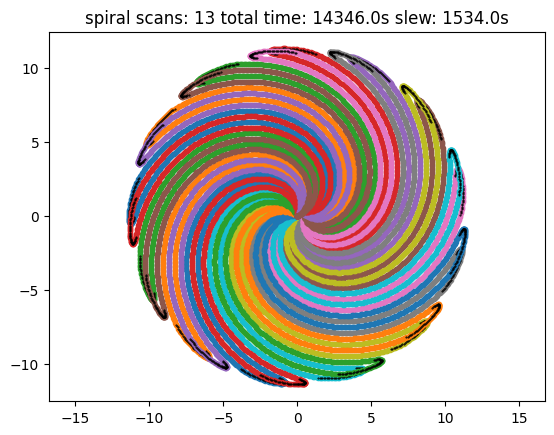

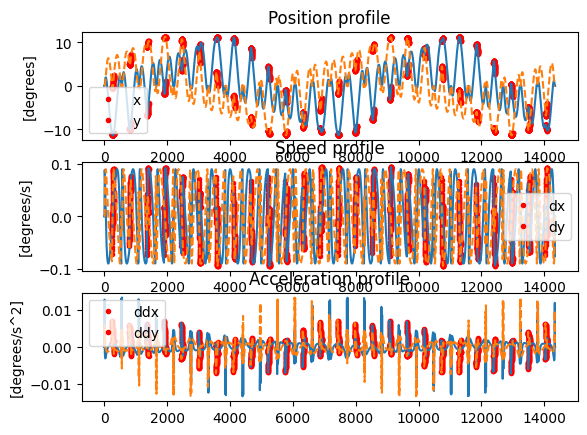

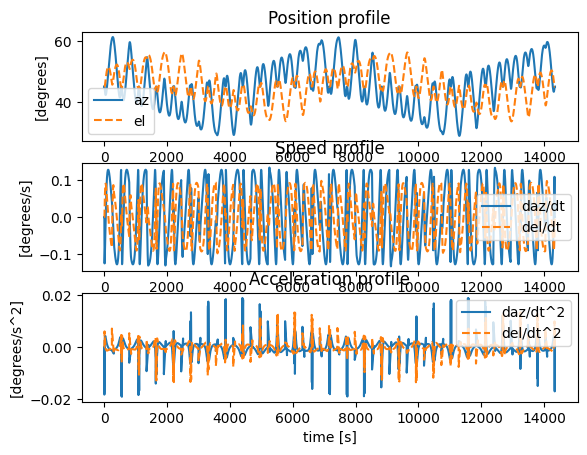

Boresight visits @ 538 sec


<Figure size 640x480 with 0 Axes>

In [25]:
# If sidelobes show up e.g. on satellite - high res map in 2*2hr - TBC
simulate_holog("--sampletime 1 --scan-extent 22 --cycle-duration 7200 --tracktime 10 --scanspeed 0.09 --num-cycles 2 --cycle-rotations 2 --twistfactor 1")

In [6]:
## Ku-band
HPBW_ku = 1.2*(.3/11.4)/15 * 180/np.pi # deg
HPBW_ku, 10*HPBW_ku

(0.12062269371175223, 1.2062269371175223)

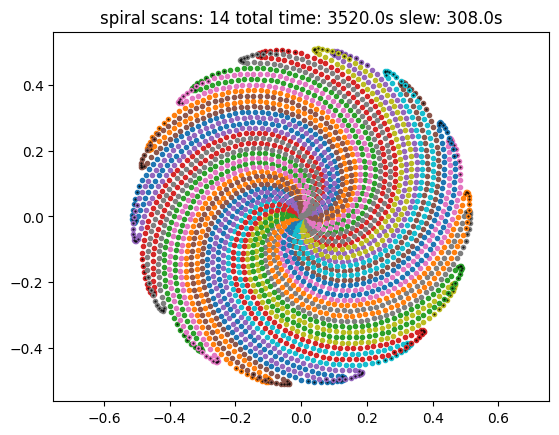

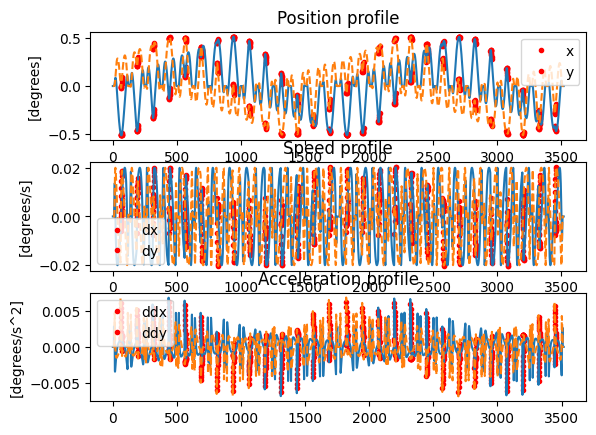

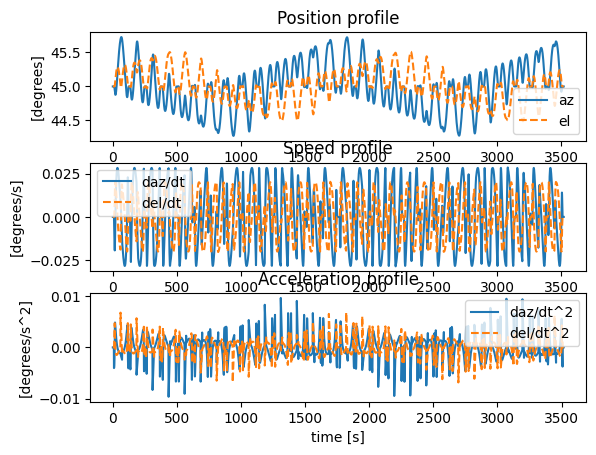

Boresight visits @ 110 sec


<Figure size 640x480 with 0 Axes>

In [7]:
# Low res map, 2*30min, for continuum sources to 3rd sidelobe. 1 cycle is too sparse, 2 cycles has adequate coverage.
simulate_holog("--scan-extent 1.0 --cycle-duration 1800 --scanspeed 0.02 --sampletime 1 --num-cycles 2 --cycle-rotation 2")

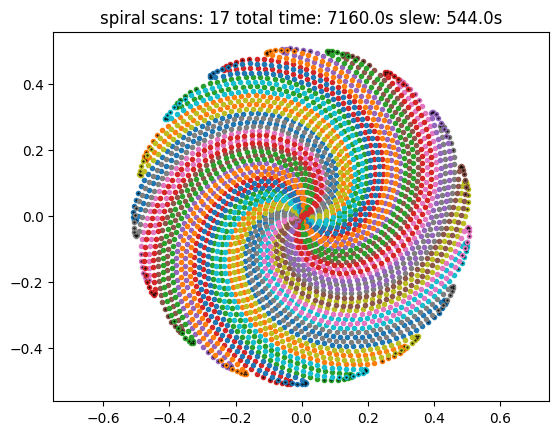

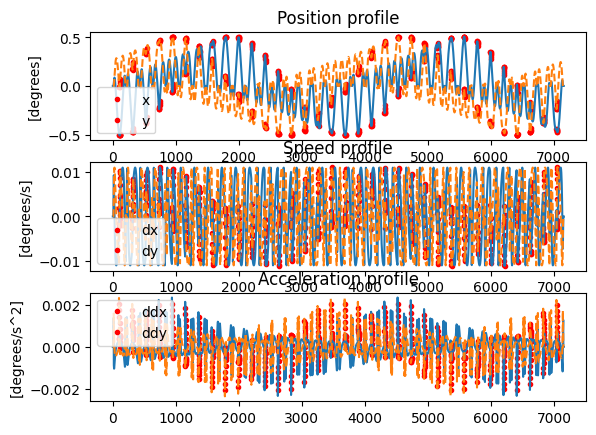

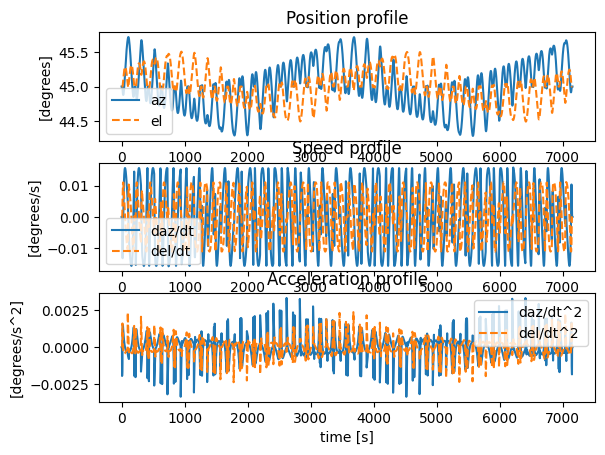

Boresight visits @ 200 sec


<Figure size 640x480 with 0 Axes>

In [11]:
# This one gave amplSNR ~ 70 on 3C 279
# simulate_holog("--scan-extent 1.0 --cycle-duration 1800 --scanspeed 0.013 --sampletime 1.33 --num-cycles 3 --cycle-rotation 3")

# MdV asked for this instead
simulate_holog("--scan-extent 1.0 --cycle-duration 3600 --scanspeed 0.011 --sampletime 2 --num-cycles 2 --cycle-rotation 2")

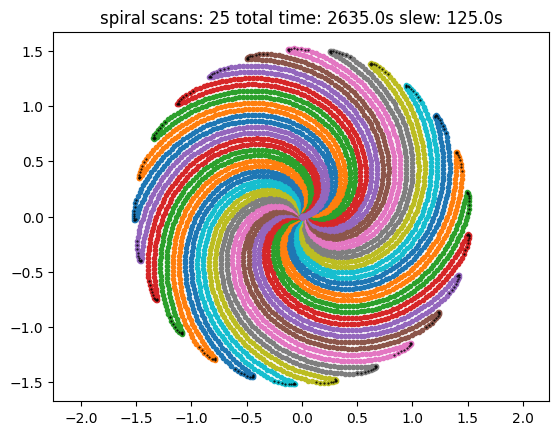

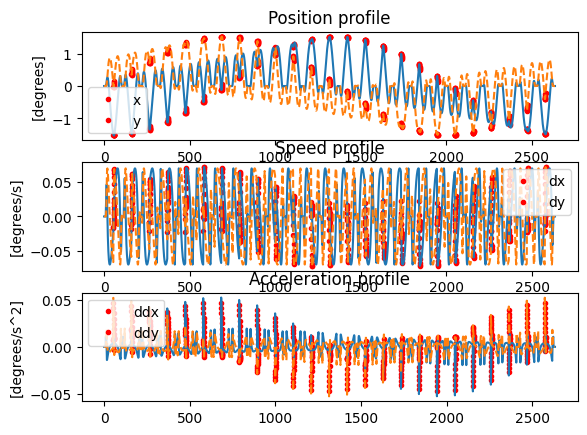

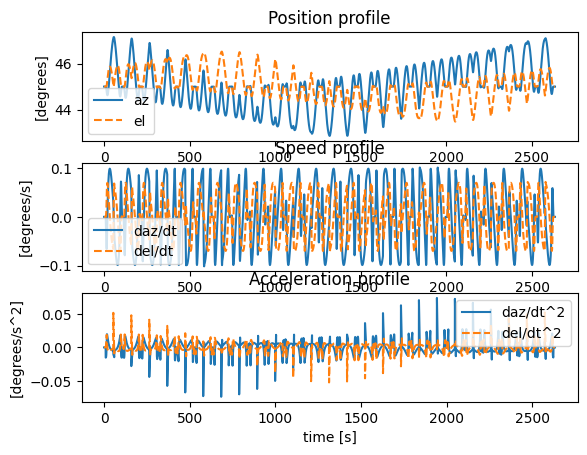

Boresight visits @ 94 sec


<Figure size 640x480 with 0 Axes>

In [8]:
# Moderate res map, 1*45min, for hight SNR targets (GEOS). 100 sec bore sight intervals. Adequately sampled by a single cycle
simulate_holog("--scan-extent 3.0 --cycle-duration 2700 --scanspeed 0.07 --sampletime 0.5")

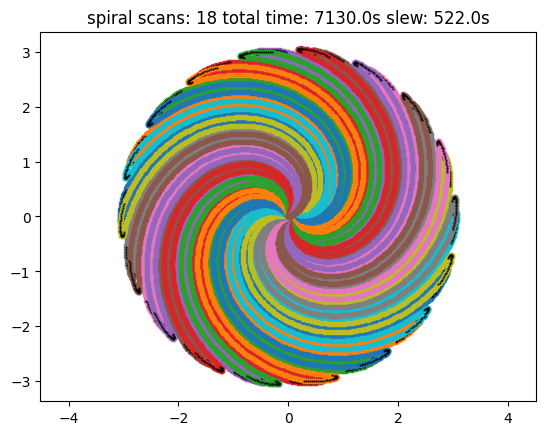

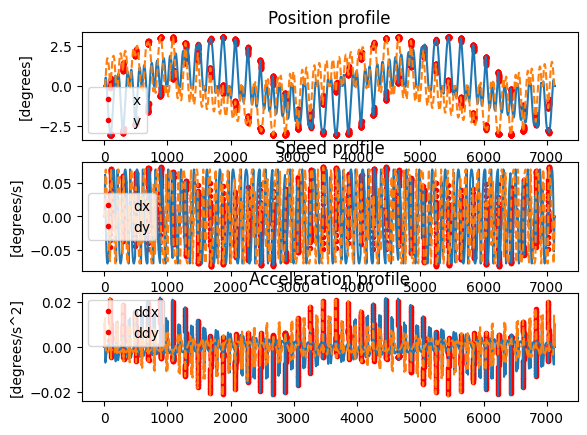

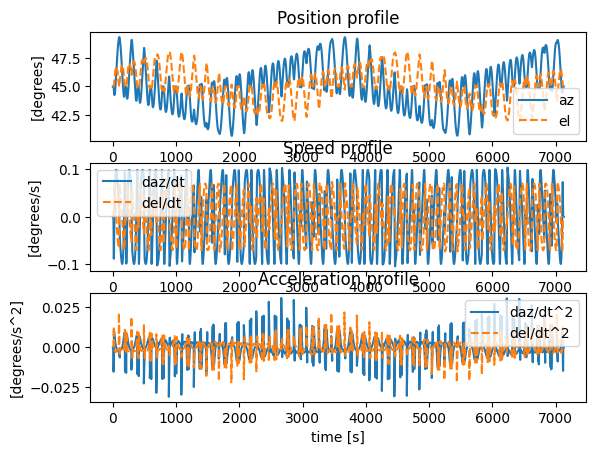

Boresight visits @ 189 sec


<Figure size 640x480 with 0 Axes>

In [29]:
# High res map, 2*1hr, very low level artefacts
simulate_holog("--scan-extent 6.0 --cycle-duration 3600 --scanspeed 0.07 --sampletime 0.5 --num-cycles 2 --cycle-rotation 2");